Drew inspirations from:
https://medium.com/epfl-extension-school/advanced-exploratory-data-analysis-eda-with-python-536fa83c578a

In [32]:
import pandas as pd
from google.cloud import bigquery
from google.oauth2 import service_account

pd.set_option('display.max_columns', None)

def get_data_from_bigquery():
    credentials = service_account.Credentials.from_service_account_file("../../config/chessthesis_service_account.json")

    bqclient = bigquery.Client(credentials = credentials)

    # Download query results.
    query_string = """
    SELECT *
    FROM chess_thesis.games_with_features
    ORDER BY year, month, day ASC
    """

    dataframe = (
        bqclient.query(query_string)
        .result()
        .to_dataframe(
            # Optionally, explicitly request to use the BigQuery Storage API. As of
            # google-cloud-bigquery version 1.26.0 and above, the BigQuery Storage
            # API is used by default.
            create_bqstorage_client=True,
        )
    )

    return dataframe

In [33]:
df = get_data_from_bigquery()
df.head()

,id,white_elo,black_elo,eco,result,year,month,day,day_of_week,white_title,black_title,white_age,black_age,games_played_last_three_months_white,games_played_last_three_months_black,games_played_last_six_months_white,games_played_last_six_months_black,games_played_last_twelve_months_white,games_played_last_twelve_months_black,games_played_last_two_years_white,games_played_last_two_years_black,games_played_last_four_years_white,games_played_last_four_years_black,games_played_last_ten_years_white,games_played_last_ten_years_black,opponent_rating_avg_last_three_months_white,opponent_rating_avg_last_three_months_black,opponent_rating_avg_last_six_months_white,opponent_rating_avg_last_six_months_black,opponent_rating_avg_last_twelve_months_white,opponent_rating_avg_last_twelve_months_black,opponent_rating_avg_last_two_years_white,opponent_rating_avg_last_two_years_black,opponent_rating_avg_last_four_years_white,opponent_rating_avg_last_four_years_black,opponent_rating_avg_last_ten_years_white,opponent_rating_avg_last_ten_years_black,opponent_rating_min_last_three_months_white,opponent_rating_min_last_three_months_black,opponent_rating_min_last_six_months_white,opponent_rating_min_last_six_months_black,opponent_rating_min_last_twelve_months_white,opponent_rating_min_last_twelve_months_black,opponent_rating_min_last_two_years_white,opponent_rating_min_last_two_years_black,opponent_rating_min_last_four_years_white,opponent_rating_min_last_four_years_black,opponent_rating_min_last_ten_years_white,opponent_rating_min_last_ten_years_black,opponent_rating_max_last_three_months_white,opponent_rating_max_last_three_months_black,opponent_rating_max_last_six_months_white,opponent_rating_max_last_six_months_black,opponent_rating_max_last_twelve_months_white,opponent_rating_max_last_twelve_months_black,opponent_rating_max_last_two_years_white,opponent_rating_max_last_two_years_black,opponent_rating_max_last_four_years_white,opponent_rating_max_last_four_years_black,opponent_rating_max_last_ten_years_white,opponent_rating_max_last_ten_years_black,rolling_three_months_performance_white,rolling_three_months_performance_black,rolling_six_months_performance_white,rolling_six_months_performance_black,rolling_twelve_months_performance_white,rolling_twelve_months_performance_black,rolling_two_years_performance_white,rolling_two_years_performance_black,rolling_four_years_performance_white,rolling_four_years_performance_black,rolling_ten_years_performance_white,rolling_ten_years_performance_black,avg_eval_diff_last_three_months_white,avg_eval_diff_last_three_months_black,avg_eval_diff_last_six_months_white,avg_eval_diff_last_six_months_black,avg_eval_diff_last_twelve_months_white,avg_eval_diff_last_twelve_months_black,avg_eval_diff_last_two_years_white,avg_eval_diff_last_two_years_black,avg_eval_diff_last_four_years_white,avg_eval_diff_last_four_years_black,avg_eval_diff_last_ten_years_white,avg_eval_diff_last_ten_years_black,best_moves_ratio_last_three_months_white,best_moves_ratio_last_three_months_black,best_moves_ratio_last_six_months_white,best_moves_ratio_last_six_months_black,best_moves_ratio_last_twelve_months_white,best_moves_ratio_last_twelve_months_black,best_moves_ratio_last_two_years_white,best_moves_ratio_last_two_years_black,best_moves_ratio_last_four_years_white,best_moves_ratio_last_four_years_black,best_moves_ratio_last_ten_years_white,best_moves_ratio_last_ten_years_black,great_moves_ratio_last_three_months_white,great_moves_ratio_last_three_months_black,great_moves_ratio_last_six_months_white,great_moves_ratio_last_six_months_black,great_moves_ratio_last_twelve_months_white,great_moves_ratio_last_twelve_months_black,great_moves_ratio_last_two_years_white,great_moves_ratio_last_two_years_black,great_moves_ratio_last_four_years_white,great_moves_ratio_last_four_years_black,great_moves_ratio_last_ten_years_white,great_moves_ratio_last_ten_years_black,good_moves_ratio_last_three_months_white,good_moves_ratio_last_three_months_black,good_mov

# EDA STEPS
1. Check for missing values
   1. Why is it missing, what can we use to fill it
2. Descriptions of features
   1. numerical: min, max
   2. categorical: number of unique values, number of occurrences of each value
3. Distributions
   1. Probability Density Function (PDF) for continous features
   2. Probability Mass Functions (PMF) for discrete features
   3. Look for
      1. skewness
      2. gaps
      3. bounds
4. Identify significant correlations
   1. With many features, compute the Pearson correlation matrix
   2. Pearson chi-square test for categorical values
5. Spot outliers
   1. e.g. with box plots

In [5]:
df.shape

(3748, 330)

In [6]:
pd.value_counts(df.dtypes)

float64    297
int64       27
object       6
dtype: int64

In [7]:
df.describe(exclude="number")

,eco,result,white_title,black_title,white_elo_group_opening,black_elo_group_opening
count,3748,3748,2719,2710,3748,3748
unique,369,3,8,8,9,9
top,B40,1/2-1/2,IM,IM,2200-2400,2200-2400
freq,88,1629,1037,1048,1700,1692


<AxesSubplot:title={'center':'Unique values per feature'}>

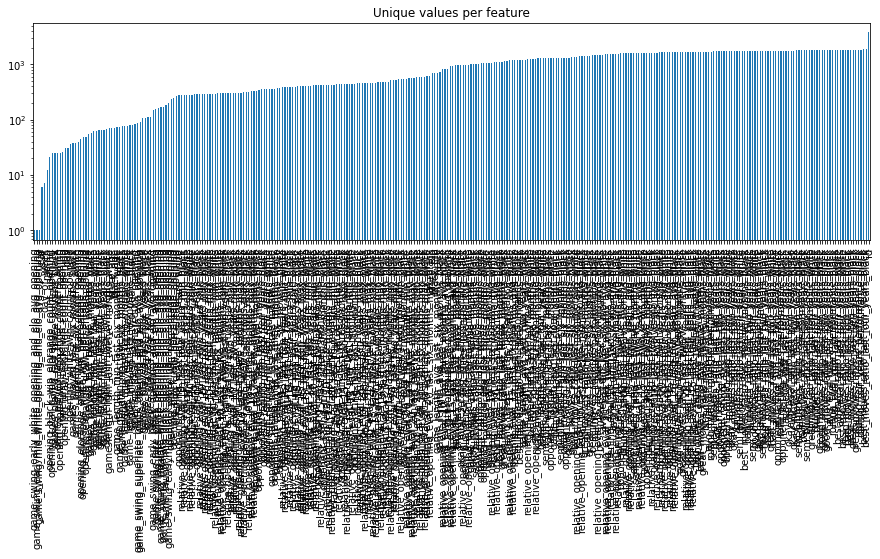

In [8]:
# For each numerical feature compute number of unique entries
unique_values = df.select_dtypes(include="number").nunique().sort_values()
# Plot information with y-axis in log-scale
unique_values.plot.bar(logy=True, figsize=(15, 4),title="Unique values per feature")

In [9]:
df.describe()

,id,white_elo,black_elo,year,month,day,day_of_week,white_age,black_age,games_played_last_three_months_white,games_played_last_three_months_black,games_played_last_six_months_white,games_played_last_six_months_black,games_played_last_twelve_months_white,games_played_last_twelve_months_black,games_played_last_two_years_white,games_played_last_two_years_black,games_played_last_four_years_white,games_played_last_four_years_black,games_played_last_ten_years_white,games_played_last_ten_years_black,opponent_rating_avg_last_three_months_white,opponent_rating_avg_last_three_months_black,opponent_rating_avg_last_six_months_white,opponent_rating_avg_last_six_months_black,opponent_rating_avg_last_twelve_months_white,opponent_rating_avg_last_twelve_months_black,opponent_rating_avg_last_two_years_white,opponent_rating_avg_last_two_years_black,opponent_rating_avg_last_four_years_white,opponent_rating_avg_last_four_years_black,opponent_rating_avg_last_ten_years_white,opponent_rating_avg_last_ten_years_black,opponent_rating_min_last_three_months_white,opponent_rating_min_last_three_months_black,opponent_rating_min_last_six_months_white,opponent_rating_min_last_six_months_black,opponent_rating_min_last_twelve_months_white,opponent_rating_min_last_twelve_months_black,opponent_rating_min_last_two_years_white,opponent_rating_min_last_two_years_black,opponent_rating_min_last_four_years_white,opponent_rating_min_last_four_years_black,opponent_rating_min_last_ten_years_white,opponent_rating_min_last_ten_years_black,opponent_rating_max_last_three_months_white,opponent_rating_max_last_three_months_black,opponent_rating_max_last_six_months_white,opponent_rating_max_last_six_months_black,opponent_rating_max_last_twelve_months_white,opponent_rating_max_last_twelve_months_black,opponent_rating_max_last_two_years_white,opponent_rating_max_last_two_years_black,opponent_rating_max_last_four_years_white,opponent_rating_max_last_four_years_black,opponent_rating_max_last_ten_years_white,opponent_rating_max_last_ten_years_black,rolling_three_months_performance_white,rolling_three_months_performance_black,rolling_six_months_performance_white,rolling_six_months_performance_black,rolling_twelve_months_performance_white,rolling_twelve_months_performance_black,rolling_two_years_performance_white,rolling_two_years_performance_black,rolling_four_years_performance_white,rolling_four_years_performance_black,rolling_ten_years_performance_white,rolling_ten_years_performance_black,avg_eval_diff_last_three_months_white,avg_eval_diff_last_three_months_black,avg_eval_diff_last_six_months_white,avg_eval_diff_last_six_months_black,avg_eval_diff_last_twelve_months_white,avg_eval_diff_last_twelve_months_black,avg_eval_diff_last_two_years_white,avg_eval_diff_last_two_years_black,avg_eval_diff_last_four_years_white,avg_eval_diff_last_four_years_black,avg_eval_diff_last_ten_years_white,avg_eval_diff_last_ten_years_black,best_moves_ratio_last_three_months_white,best_moves_ratio_last_three_months_black,best_moves_ratio_last_six_months_white,best_moves_ratio_last_six_months_black,best_moves_ratio_last_twelve_months_white,best_moves_ratio_last_twelve_months_black,best_moves_ratio_last_two_years_white,best_moves_ratio_last_two_years_black,best_moves_ratio_last_four_years_white,best_moves_ratio_last_four_years_black,best_moves_ratio_last_ten_years_white,best_moves_ratio_last_ten_years_black,great_moves_ratio_last_three_months_white,great_moves_ratio_last_three_months_black,great_moves_ratio_last_six_months_white,great_moves_ratio_last_six_months_black,great_moves_ratio_last_twelve_months_white,great_moves_ratio_last_twelve_months_black,great_moves_ratio_last_two_years_white,great_moves_ratio_last_two_years_black,great_moves_ratio_last_four_years_white,great_moves_ratio_last_four_years_black,great_moves_ratio_last_ten_years_white,great_moves_ratio_last_ten_years_black,good_moves_ratio_last_three_months_white,good_moves_ratio_last_three_months_black,good_moves_ratio_last_six_months_white,good

Takeaways:
1. eval diff min and max values are too spread (thousands..) -> fix position evaluations min and max values
2. Potential data leakage at **opening_white_win_count_opening** and similar features
3. game_swing_mid_white_opening_and_elo_avg_opening and game_swing_early_white_opening_and_elo_avg_opening is 0 everywhere (or null)
4. opening_white_win_elorange_count_opening and similar columns sometimes value is too high (e.g. 1210, 909, 1629 etc)
5. opening_white_win_percentage_opening and similar columns: values are too low (max is 16)

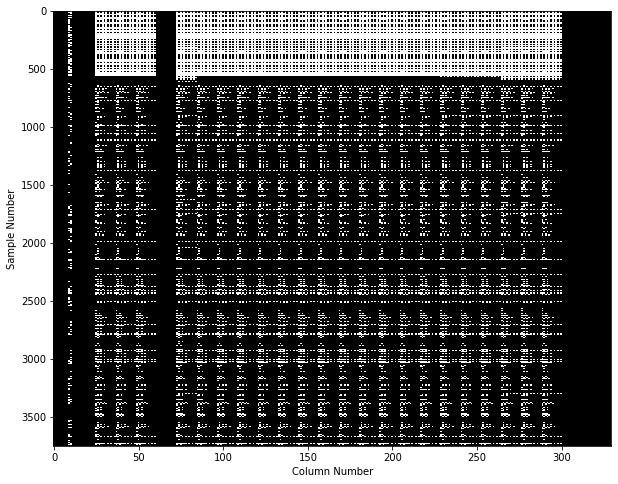

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(df.isna(), aspect="auto", interpolation="nearest", cmap="gray")
plt.xlabel("Column Number")
plt.ylabel("Sample Number");

Defaulting to user installation because normal site-packages is not writeable


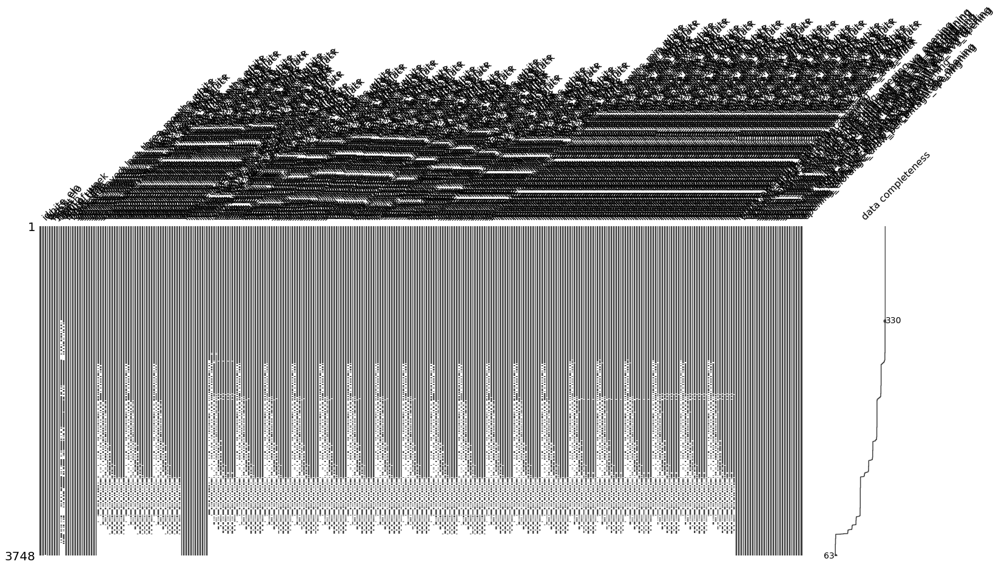

In [11]:
import missingno as msno

msno.matrix(df, labels=True, sort="descending");

Too many missing values for early datapoints, shouldn't we drop data points above a certain threshold?

In [14]:
missing_ratio_per_features = df.isna().mean().sort_values()
missing_ratio_per_features

id                                                      0.000000
opening_draw_count_opening                              0.000000
opening_black_win_count_opening                         0.000000
opening_white_win_count_opening                         0.000000
opening_total_game_count_opening                        0.000000
                                                          ...   
avg_eval_diff_last_three_months_black                   0.409018
relative_opening_eval_20_last_three_months_max_white    0.410886
relative_opening_eval_20_last_three_months_min_white    0.410886
relative_opening_eval_20_last_three_months_avg_white    0.410886
avg_eval_diff_last_three_months_white                   0.413287
Length: 330, dtype: float64

Lot of missing features with that were calculated based on the last 3 month's data. Maybe it's a good idea to use a higher interval instead (6, 12 months or more)

<AxesSubplot:title={'center':'Percentage of missing values per feature'}, ylabel='Ratio of missing values per feature'>

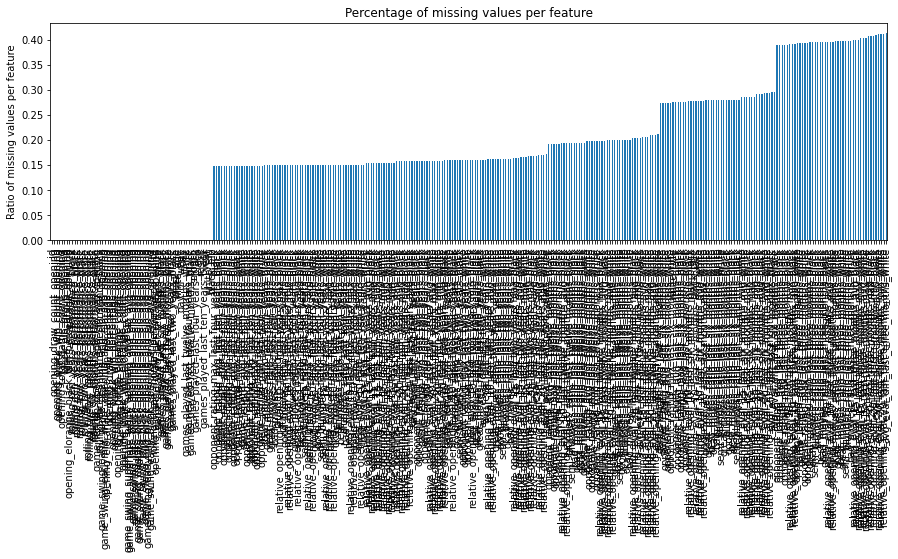

In [12]:
# Ratio of missing values per feature
df.isna().mean().sort_values().plot(
    kind="bar", figsize=(15, 4),
    title="Percentage of missing values per feature",
    ylabel="Ratio of missing values per feature"
    )

array([[<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplo

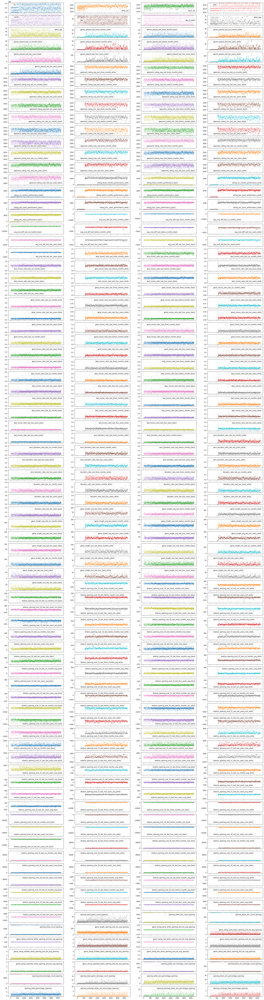

In [23]:
df.plot(lw=0,
          marker=".",
          subplots=True,
          layout=(-1, 4),
          figsize=(30, 120),
          markersize=1)

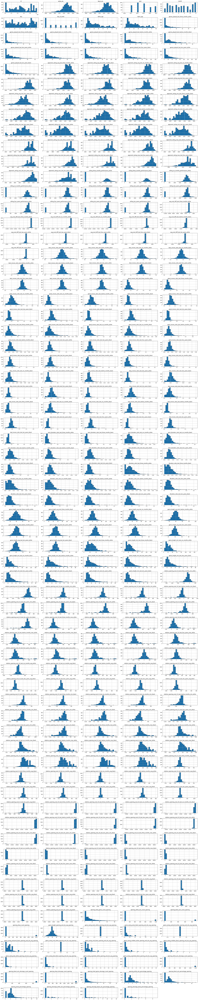

In [24]:
# Plots the histogram for each numerical feature in a separate subplot
df.hist(bins=25, figsize=(30, 150), layout=(-1, 5), edgecolor="black")
plt.tight_layout()

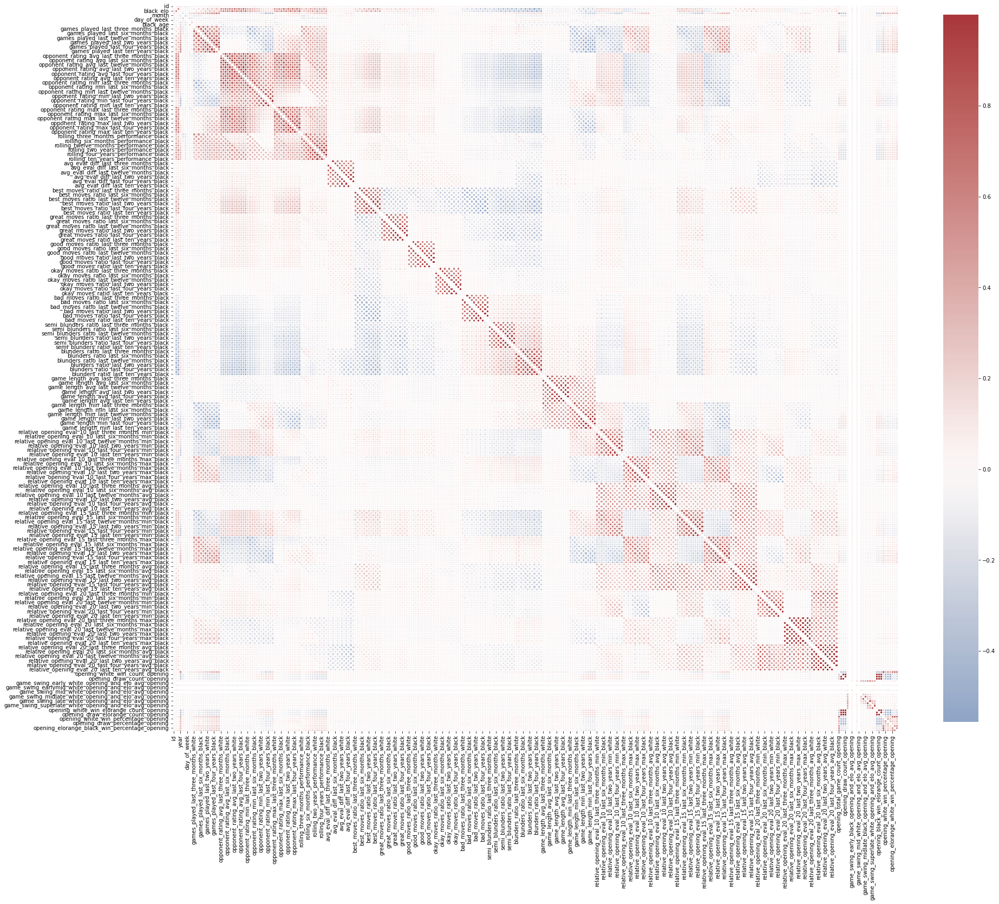

In [25]:
import numpy as np
import seaborn as sns

# Computes feature correlation
df_corr = df.corr(method="pearson")

# Plot correlation matrix
plt.figure(figsize=(30, 30))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

In [27]:
#  Creates a mask to remove the diagonal and the upper triangle.
lower_triangle_mask = np.tril(np.ones(df_corr.shape), k=-1).astype("bool")

#  Stack all correlations, after applying the mask
df_corr_stacked = df_corr.where(lower_triangle_mask).stack().sort_values()

#  Showing the lowest and highest correlations in the correlation matrix
df_corr_stacked

blunders_ratio_last_ten_years_white                white_elo                                            -0.555915
blunders_ratio_last_four_years_white               white_elo                                            -0.555026
blunders_ratio_last_two_years_white                white_elo                                            -0.536562
blunders_ratio_last_ten_years_black                black_elo                                            -0.535799
blunders_ratio_last_four_years_black               black_elo                                            -0.535319
                                                                                                           ...   
opening_draw_elorange_count_opening                opening_black_win_elorange_count_opening              0.999988
                                                   opening_white_win_elorange_count_opening              0.999990
relative_opening_eval_10_last_ten_years_min_white  relative_opening_eval_10_last_four_ye

***Note**: Depending on the dataset and the kind of features (e.g. ordinal or continuous features) you might want to use the spearman method instead of the pearson method to compute the correlation. Whereas the **Pearson** correlation evaluates the linear relationship between two continuous variables, the **Spearman** correlation evaluates the monotonic relationship based on the ranked values for each feature.*

In [26]:
# Collects for each feature the most frequent entry
most_frequent_entry = df.mode()

# Checks for each entry if it contains the most frequent entry
df_freq = df.eq(most_frequent_entry.values, axis=1)

# Computes the mean of the 'is_most_frequent' occurrence
df_freq = df_freq.mean().sort_values(ascending=False)

# Show the 5 top features with the highest ratio of singular value content
print(df_freq.head())
print(df_freq.tail())


opening_elorange_draw_percentage_opening    0.000267
rolling_ten_years_performance_white         0.000267
games_played_last_four_years_black          0.000267
games_played_last_ten_years_white           0.000267
games_played_last_ten_years_black           0.000267
dtype: float64
okay_moves_ratio_last_twelve_months_black    0.0
okay_moves_ratio_last_twelve_months_white    0.0
okay_moves_ratio_last_six_months_black       0.0
okay_moves_ratio_last_six_months_white       0.0
blunders_ratio_last_four_years_white         0.0
dtype: float64
